In [4]:
# Библиотеки
%pip install pandas numpy
import pandas as pd
import numpy as np
import json
import os
%pip install scipy seaborn
import matplotlib.pyplot as plt
import seaborn as sns

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: C:\Users\Valentin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: C:\Users\Valentin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
# Файл Orders
# OrderID - ID Заказа,
# UserID - ID клиента,
# OrderTime - время заказа,
# items - список элементов в заказе, каждый элемент описан словарем:
#  ItemID  - ID продукта, 
#  price - цена единицы товара, 
# quantity - количество единиц товара в заказе

# Файл Categories

# ItemID - ID продукта,
# Category - категория продукта,
# ParentCategory - более крупная категория продукта

# Задание
# 1.Визуализируйте динамику продаж напитков в ParentCategory. Есть ли эффект сезонности в продажах?
# 2.Исследуйте и покажите на графике, как отличаются продажи в будние и выходные в категориях 'Сокосодержащие напитки, смузи' и "Печенье" ?
# 3.Визуализируйте структуру продаж ParentCategory по показателю GMV за один месяц. Укажите категорию с наибольшей долей GMV.
# 4.Исследуйте взаимосвясь между продажами категорий 'Чипсы, снеки, попкорн' и 
# напитками:'Вода', 'Газированные напитки', 'Соки, нектары', 'Лимонады', 'Безалкогольное пиво', 'Вино', 'Пиво'. С чем сильнее коррелируют 'Чипсы, снеки, попкорн'?

In [2]:
# Чтение файлов
categories=pd.read_csv('..\Home_worK\categories.csv')
orders=pd.read_json(os.path.join('..','Home_worK','orders.json'))

In [3]:
# Создаем DataFrame из списка purch
doom=orders.explode('items',ignore_index = True)
purch=list([])
for i in range(len(doom)):
    q=list([])
    g=list(doom['items'][i].values())
    p=doom['Date'][i]
    g.append(p)
    purch.append(g)
purch_table=pd.DataFrame(purch,columns=['ItemID', 'price','quantity','date']);
purch_table['income']=purch_table['price']*purch_table['quantity'];
purch_table['ItemID']=purch_table['ItemID'].astype(int)
total_tab=pd.merge(purch_table,categories, on='ItemID');
total_tab.head(5)

,ItemID,price,quantity,date,income,Category,ParentCategory
0,413736,36.72,2,2021-01-01,73.44,Мороженое,Молочная продукция
1,523171,90.32,1,2021-01-01,90.32,Полуфабрикаты,Бакалея
2,452831,223.11,1,2021-01-01,223.11,Овощные смеси,Овощи и фрукты
3,303673,59.90,7,2021-01-01,419.30,Фрукты,Овощи и фрукты
4,318193,319.91,2,2021-01-01,639.82,Фрукты,Овощи и фрукты


In [14]:
# Создаем таблицу с количеством продаж/покупок по дате
a=total_tab.query('ParentCategory=="Напитки"')
a.groupby('date')['quantity'].sum()
sales=a.groupby(['date'])['quantity'].sum().reset_index();
sales.sort_values(by='quantity', ascending=False)
# Создаем таблицу с доходом по дате
drinks=total_tab.query('ParentCategory=="Напитки"')
drinks
drinks.groupby(['date','ParentCategory'])['income'].sum()
drink=drinks.groupby(['date','ParentCategory'])['income'].sum().reset_index();
drink
# Объединяем таблци sales and drink по дате
table_1=pd.merge(sales,drink, on='date', how='left')
table_1
table_1['Month'] = pd.DatetimeIndex(table_1['date']).month
Quarter_Mapping = {1:1, 2:1, 3:1, 4:2, 5:2, 6:2, 7:3, 8:3, 9:3, 10:4, 11:4, 12:4}
table_1['Quarter'] = table_1['Month'].map(Quarter_Mapping)
table_1.rename(columns={'quantity': 'Sales'},inplace=True)

In [16]:
table_1.head(10)

,date,Sales,ParentCategory,income,Month,Quarter
0,2021-01-01,279,Напитки,22520.77,1,1
1,2021-01-02,733,Напитки,62638.15,1,1
2,2021-01-03,845,Напитки,68997.68,1,1
3,2021-01-04,1106,Напитки,89075.82,1,1
4,2021-01-05,974,Напитки,73227.55,1,1


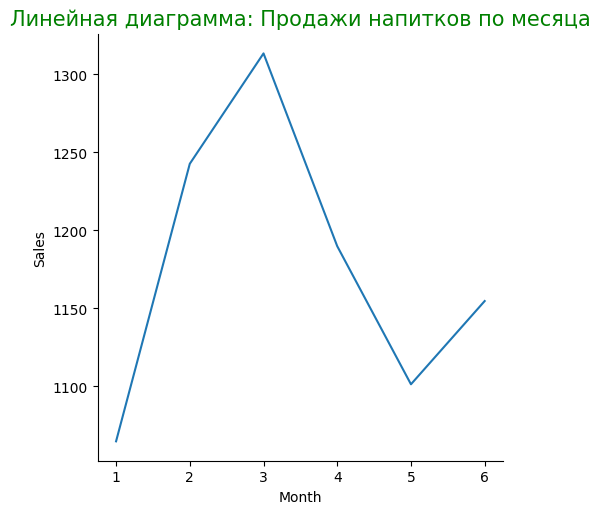

In [15]:
# 1.Визуализируйте динамику продаж напитков в ParentCategory. Есть ли эффект сезонности в продажах?
# Стром диаграмму по таблицу Table_1- продажи напитков по месяцам
sns.relplot(
    x='Month',
    y='Sales', 
    dashes=False, 
    markers=True,
    data=table_1, 
    kind='line', 
    errorbar=None)
plt.title('Линейная диаграмма: Продажи напитков по месяца', size=15, color='g');

# Так как месячных данных очень мало, сложно сделать вывод о сезонности продаж напитков. Из граффика видно, что в 1 квартале продажи росли, в то время, как во втором квартале они снизились,
# но с мая по июнь продажи начали возрастать. Можно предположить, что в летний период с июня по август продажи напитков будут расти. 

In [19]:
# 2.Исследуйте и покажите на графике, как отличаются продажи в будние и выходные в категориях 'Сокосодержащие напитки, смузи' и "Печенье" ?
from datetime import datetime as dt
total_tab.head(5)
prod=total_tab.loc[((total_tab['Category']=='Сокосодержащие напитки, смузи')|(total_tab['Category']=='Печенье'))].reset_index()
#prod.Category.value_counts().head()
prod['daywk']=prod['date'].dt.day_name()
prod['weekend']=''
prod=prod.reset_index(drop = True)
for i in range(len(prod)):
    if prod['daywk'][i]=='Sunday':
        prod['weekend'][i]='Y'
    else:
        prod['weekend'][i]='N'
prod.head()

C:\Users\Valentin\AppData\Local\Temp\ipykernel_12092\853499540.py:13: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  prod['weekend'][i]='N'
C:\Users\Valentin\AppData\Local\Temp\ipykernel_12092\853499540.py:13: SettingWithCopyWarning: 
A value

,index,ItemID,price,quantity,date,income,Category,ParentCategory,daywk,weekend
0,41,875721,63.38,1,2021-01-01,63.38,Печенье,Мучные изделия,Friday,N
1,156,513299,77.90,1,2021-01-01,77.90,Печенье,Мучные изделия,Friday,N
2,161,308902,73.90,1,2021-01-01,73.90,Печенье,Мучные изделия,Friday,N
3,165,309860,77.90,1,2021-01-01,77.90,Печенье,Мучные изделия,Friday,N
4,177,304614,83.90,2,2021-01-01,167.80,Печенье,Мучные изделия,Friday,N


In [22]:
prod.head(10)
prof=prod.groupby(['date','Category'])['quantity'].sum().reset_index()
prof['daywk']=prof['date'].dt.day_name()
prof['weekend']=''
prof=prof.reset_index(drop = True)
for i in range(len(prof)):
    if prof['daywk'][i]=='Sunday':
        prof['weekend'][i]='Y'
    else:
        prof['weekend'][i]='N'
prof['Month'] = pd.DatetimeIndex(prof['date']).month
Quarter_Mapping = {1:1, 2:1, 3:1, 4:2, 5:2, 6:2, 7:3, 8:3, 9:3, 10:4, 11:4, 12:4}
prof['Quarter'] = prof['Month'].map(Quarter_Mapping)
prof.rename(columns={'quantity': 'sales'},inplace=True)

C:\Users\Valentin\AppData\Local\Temp\ipykernel_12092\1611065556.py:10: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  prof['weekend'][i]='N'
C:\Users\Valentin\AppData\Local\Temp\ipykernel_12092\1611065556.py:10: SettingWithCopyWarning: 
A val

In [24]:
prof.head(10)

,date,Category,sales,daywk,weekend,Month,Quarter
0,2021-01-01,Печенье,26,Friday,N,1,1
1,2021-01-01,"Сокосодержащие напитки, смузи",7,Friday,N,1,1
2,2021-01-02,Печенье,43,Saturday,N,1,1
3,2021-01-02,"Сокосодержащие напитки, смузи",2,Saturday,N,1,1
4,2021-01-03,Печенье,58,Sunday,Y,1,1
5,2021-01-03,"Сокосодержащие напитки, смузи",44,Sunday,Y,1,1
6,2021-01-04,Печенье,131,Monday,N,1,1
7,2021-01-04,"Сокосодержащие напитки, смузи",7,Monday,N,1,1
8,2021-01-05,Печенье,116,Tuesday,N,1,1
9,2021-01-05,"Сокосодержащие напитки, смузи",3,Tuesday,N,1,1


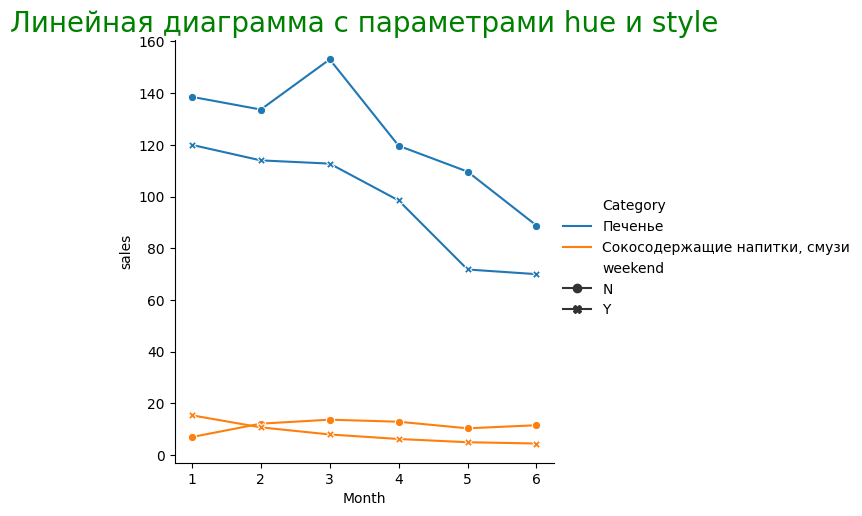

In [25]:
sns.relplot(
    x='Month',
    y='sales', 
    hue='Category',
    style='weekend', 
    dashes=False, 
    markers=True,
    data=prof, 
    kind='line', 
    errorbar=None)
plt.title('Линейная диаграмма с параметрами hue и style', size=20, color='g');